In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score, roc_curve


In [2]:
data_v0 = pd.read_csv('clusters-4-v0.csv')
data_v1 = pd.read_csv('clusters-4-v1.csv')
data_v2 = pd.read_csv('clusters-4-v2.csv')

x_train_v0, x_test_v0, y_train_v0, y_test_v0 = train_test_split(data_v0[['x1','x2']], data_v0['y'], test_size=0.2, random_state=42)
x_train_v1, x_test_v1, y_train_v1, y_test_v1 = train_test_split(data_v1[['x1','x2']], data_v1['y'], test_size=0.2, random_state=42)
x_train_v2, x_test_v2, y_train_v2, y_test_v2 = train_test_split(data_v2[['x1','x2']], data_v2['y'], test_size=0.2, random_state=42)

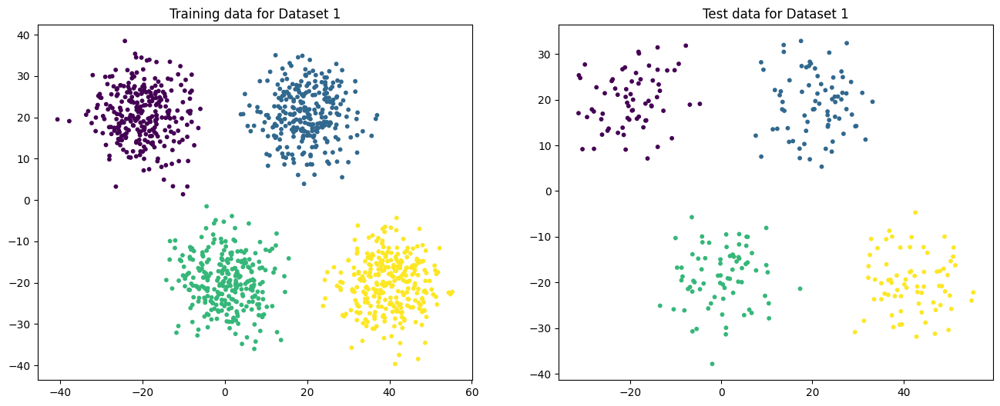

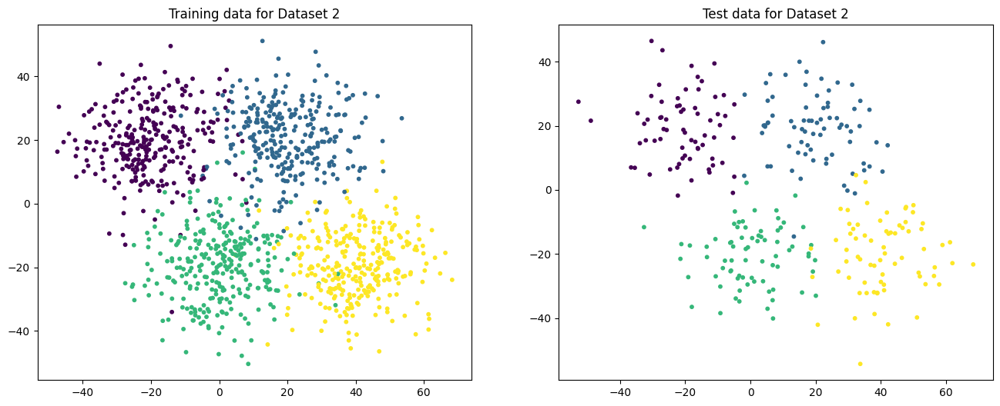

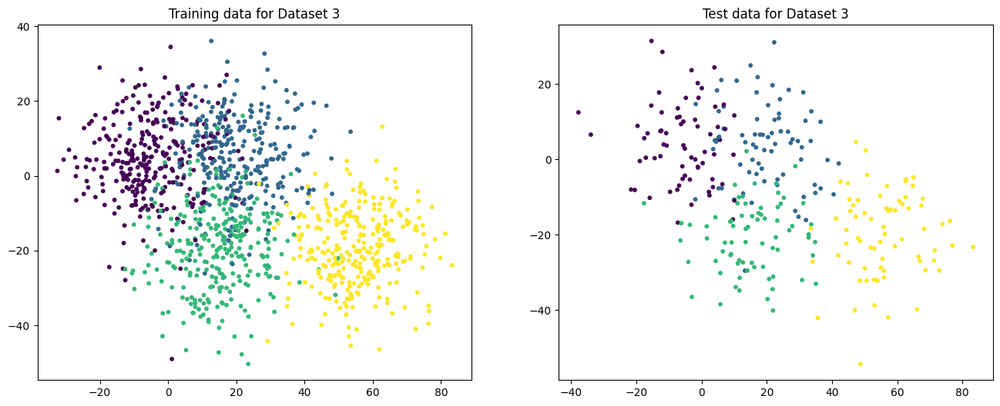

In [3]:
# plot training data and test data side by side for Dataset 1
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.scatter(x_train_v0['x1'], x_train_v0['x2'], c=y_train_v0, cmap='viridis', s=10)
plt.title('Training data for Dataset 1')

plt.subplot(1, 2, 2)
plt.scatter(x_test_v0['x1'], x_test_v0['x2'], c=y_test_v0, cmap='viridis', s=10)
plt.title('Test data for Dataset 1')
plt.savefig('Images/dataset-1-train-test.png', dpi=400)
plt.show()

# plot training data and test data side by side for Dataset 2
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.scatter(x_train_v1['x1'], x_train_v1['x2'], c=y_train_v1, cmap='viridis', s=10)
plt.title('Training data for Dataset 2')

plt.subplot(1, 2, 2)
plt.scatter(x_test_v1['x1'], x_test_v1['x2'], c=y_test_v1, cmap='viridis', s=10)
plt.title('Test data for Dataset 2')
plt.savefig('Images/dataset-2-train-test.png', dpi=400)
plt.show()

# plot training data and test data side by side for Dataset 3
plt.figure(figsize=(16, 6))
plt.subplot(1, 2, 1)
plt.scatter(x_train_v2['x1'], x_train_v2['x2'], c=y_train_v2, cmap='viridis', s=10)
plt.title('Training data for Dataset 3')

plt.subplot(1, 2, 2)
plt.scatter(x_test_v2['x1'], x_test_v2['x2'], c=y_test_v2, cmap='viridis', s=10)
plt.title('Test data for Dataset 3')
plt.savefig('Images/dataset-3-train-test.png', dpi=400)
plt.show()

Class balance in Dataset 1:
y
1    360
2    360
3    360
4    360
Name: count, dtype: int64

Class balance in Dataset 2:
y
1    360
2    360
3    360
4    360
Name: count, dtype: int64

Class balance in Dataset 3:
y
1    360
2    360
3    360
4    360
Name: count, dtype: int64



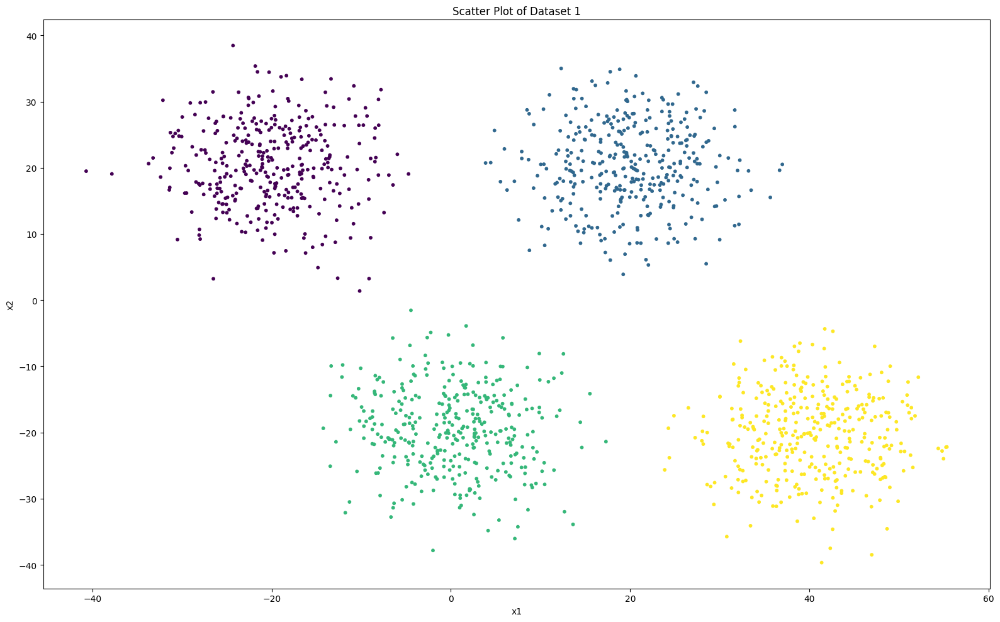

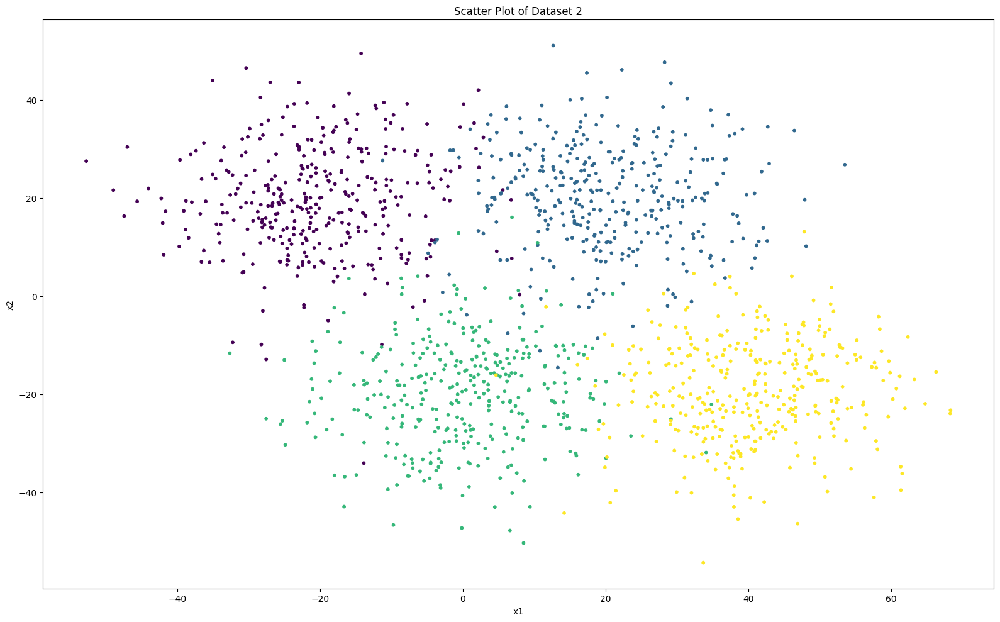

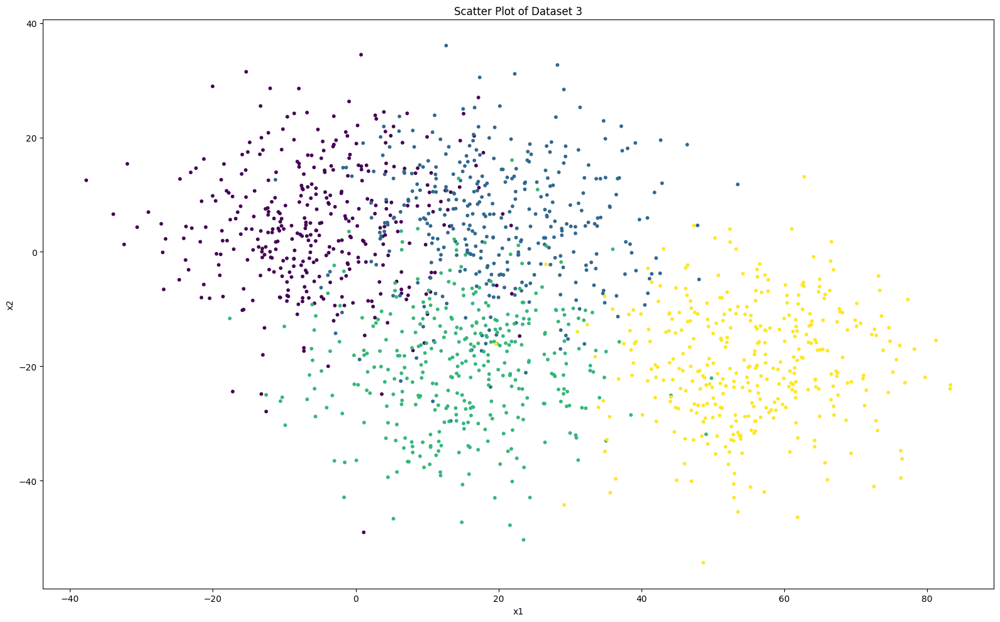

In [4]:
# List of datasets
datasets = [(data_v0, "Dataset 1"), (data_v1, "Dataset 2"), (data_v2, "Dataset 3")]

# Iterate over each dataset for visualization and analysis
for i, (data, label) in enumerate(datasets):
    # Scatter Plot
    plt.figure(figsize=(16, 10))
    
    # plt.subplot(1, 2, 1)
    plt.scatter(data['x1'], data['x2'], c=data['y'], cmap='viridis', s=10)
    plt.title(f'Scatter Plot of {label}')
    plt.xlabel('x1')
    plt.ylabel('x2')
    
    plt.tight_layout()
    plt.savefig(f'Images/dataset-{i+1}-overview.png', dpi=400)
    # plt.show()
    
    class_counts = data['y'].value_counts()
    print(f"Class balance in {label}:\n{class_counts}\n")

In [5]:
def draw_decision_boundary(model, X, y, resolution=100, size=10, edgecolor='k'):
    # Set up the grid for plotting
    x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
    y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, resolution), np.linspace(y_min, y_max, resolution))

    # Predict on the grid
    Z = model.predict(np.c_[xx.ravel(), yy.ravel()])
    Z = Z.reshape(xx.shape)

    # Plot the decision boundary
    plt.contourf(xx, yy, Z, cmap='viridis', alpha=0.3)
    plt.scatter(X[:, 0], X[:, 1], c=y, edgecolors=edgecolor, cmap='viridis', s=size)  

Classification results for Dataset 1:

Logistic Regression Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


SVC Linear Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


SVC RBF Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


Random Forest (min_samples_leaf=1) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Random Forest (min_samples_leaf=3) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Random Forest (min_samples_leaf=5) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,)) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      0.99      0.99        74
           4       0.99      1.00      0.99        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5)) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288

Neural Network (hidden_layer_sizes=(5,5,5)) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      1.00      1.00        74
           4       1.00      1.00      1.00        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(10,)) Accuracy: 1.00, 1.00
              precision    recall  f1-score   support

           1       1.00      1.00      1.00        68
           2       1.00      1.00      1.00        75
           3       1.00      0.99      0.99        74
           4       0.99      1.00      0.99        71

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(




Classification results for Dataset 2:

Logistic Regression Accuracy: 0.95, 0.95
              precision    recall  f1-score   support

           1       0.97      0.99      0.98        68
           2       0.97      0.93      0.95        75
           3       0.93      0.95      0.94        74
           4       0.94      0.96      0.95        71

    accuracy                           0.95       288
   macro avg       0.96      0.96      0.96       288
weighted avg       0.96      0.95      0.95       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


SVC Linear Accuracy: 0.95, 0.95
              precision    recall  f1-score   support

           1       0.97      0.99      0.98        68
           2       0.97      0.93      0.95        75
           3       0.93      0.95      0.94        74
           4       0.94      0.96      0.95        71

    accuracy                           0.95       288
   macro avg       0.96      0.96      0.96       288
weighted avg       0.96      0.95      0.95       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


SVC RBF Accuracy: 0.96, 0.96
              precision    recall  f1-score   support

           1       0.96      0.99      0.97        68
           2       0.96      0.95      0.95        75
           3       0.94      0.97      0.95        74
           4       0.99      0.93      0.96        71

    accuracy                           0.96       288
   macro avg       0.96      0.96      0.96       288
weighted avg       0.96      0.96      0.96       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


Random Forest (min_samples_leaf=1) Accuracy: 0.93, 0.93
              precision    recall  f1-score   support

           1       0.92      0.97      0.94        68
           2       0.96      0.89      0.92        75
           3       0.92      0.93      0.93        74
           4       0.94      0.94      0.94        71

    accuracy                           0.93       288
   macro avg       0.93      0.94      0.93       288
weighted avg       0.93      0.93      0.93       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Random Forest (min_samples_leaf=3) Accuracy: 0.94, 0.94
              precision    recall  f1-score   support

           1       0.93      0.99      0.96        68
           2       0.96      0.92      0.94        75
           3       0.95      0.93      0.94        74
           4       0.94      0.94      0.94        71

    accuracy                           0.94       288
   macro avg       0.94      0.95      0.94       288
weighted avg       0.94      0.94      0.94       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Random Forest (min_samples_leaf=5) Accuracy: 0.95, 0.95
              precision    recall  f1-score   support

           1       0.97      0.99      0.98        68
           2       0.96      0.93      0.95        75
           3       0.95      0.96      0.95        74
           4       0.94      0.94      0.94        71

    accuracy                           0.95       288
   macro avg       0.96      0.96      0.96       288
weighted avg       0.95      0.95      0.95       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,)) Accuracy: 0.91, 0.91
              precision    recall  f1-score   support

           1       0.96      1.00      0.98        68
           2       1.00      0.87      0.93        75
           3       0.98      0.80      0.88        74
           4       0.76      0.99      0.86        71

    accuracy                           0.91       288
   macro avg       0.93      0.91      0.91       288
weighted avg       0.93      0.91      0.91       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5)) Accuracy: 0.94, 0.94
              precision    recall  f1-score   support

           1       0.97      0.97      0.97        68
           2       0.99      0.92      0.95        75
           3       0.92      0.95      0.93        74
           4       0.91      0.94      0.92        71

    accuracy                           0.94       288
   macro avg       0.95      0.95      0.94       288
weighted avg       0.95      0.94      0.94       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5,5)) Accuracy: 0.94, 0.94
              precision    recall  f1-score   support

           1       0.94      0.99      0.96        68
           2       0.97      0.93      0.95        75
           3       0.93      0.92      0.93        74
           4       0.92      0.93      0.92        71

    accuracy                           0.94       288
   macro avg       0.94      0.94      0.94       288
weighted avg       0.94      0.94      0.94       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(10,)) Accuracy: 0.95, 0.95
              precision    recall  f1-score   support

           1       0.96      0.99      0.97        68
           2       0.96      0.93      0.95        75
           3       0.93      0.96      0.95        74
           4       0.96      0.93      0.94        71

    accuracy                           0.95       288
   macro avg       0.95      0.95      0.95       288
weighted avg       0.95      0.95      0.95       288



Classification results for Dataset 3:

Logistic Regression Accuracy: 0.86, 0.86
              precision    recall  f1-score   support

           1       0.81      0.91      0.86        68
           2       0.88      0.69      0.78        75
           3       0.81      0.89      0.85        74
           4       0.96      0.96      0.96        71

    accuracy                           0.86       288
   macro avg       0.86      0.86      0.86       288
weighted avg       0.87      0.86      0

/tmp/ipykernel_7665/3588746513.py:28: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(16, 10))
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


SVC Linear Accuracy: 0.86, 0.86
              precision    recall  f1-score   support

           1       0.81      0.90      0.85        68
           2       0.88      0.69      0.78        75
           3       0.82      0.92      0.87        74
           4       0.96      0.96      0.96        71

    accuracy                           0.86       288
   macro avg       0.87      0.87      0.86       288
weighted avg       0.87      0.86      0.86       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


SVC RBF Accuracy: 0.87, 0.87
              precision    recall  f1-score   support

           1       0.83      0.87      0.85        68
           2       0.89      0.72      0.79        75
           3       0.80      0.95      0.87        74
           4       0.99      0.96      0.97        71

    accuracy                           0.87       288
   macro avg       0.88      0.87      0.87       288
weighted avg       0.88      0.87      0.87       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


Random Forest (min_samples_leaf=1) Accuracy: 0.85, 0.85
              precision    recall  f1-score   support

           1       0.79      0.90      0.84        68
           2       0.86      0.65      0.74        75
           3       0.82      0.88      0.85        74
           4       0.92      0.97      0.95        71

    accuracy                           0.85       288
   macro avg       0.85      0.85      0.84       288
weighted avg       0.85      0.85      0.84       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Random Forest (min_samples_leaf=3) Accuracy: 0.85, 0.85
              precision    recall  f1-score   support

           1       0.81      0.87      0.84        68
           2       0.84      0.69      0.76        75
           3       0.81      0.89      0.85        74
           4       0.94      0.96      0.95        71

    accuracy                           0.85       288
   macro avg       0.85      0.85      0.85       288
weighted avg       0.85      0.85      0.85       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Random Forest (min_samples_leaf=5) Accuracy: 0.85, 0.85
              precision    recall  f1-score   support

           1       0.82      0.87      0.84        68
           2       0.85      0.69      0.76        75
           3       0.81      0.91      0.85        74
           4       0.94      0.96      0.95        71

    accuracy                           0.85       288
   macro avg       0.86      0.86      0.85       288
weighted avg       0.86      0.85      0.85       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,)) Accuracy: 0.73, 0.73
              precision    recall  f1-score   support

           1       0.87      0.78      0.82        68
           2       0.77      0.44      0.56        75
           3       0.77      0.80      0.78        74
           4       0.61      0.92      0.73        71

    accuracy                           0.73       288
   macro avg       0.75      0.73      0.72       288
weighted avg       0.75      0.73      0.72       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5)) Accuracy: 0.80, 0.80
              precision    recall  f1-score   support

           1       0.78      0.91      0.84        68
           2       0.88      0.57      0.69        75
           3       0.78      0.80      0.79        74
           4       0.77      0.92      0.84        71

    accuracy                           0.80       288
   macro avg       0.80      0.80      0.79       288
weighted avg       0.80      0.80      0.79       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(5,5,5)) Accuracy: 0.81, 0.81
              precision    recall  f1-score   support

           1       0.87      0.76      0.81        68
           2       0.84      0.65      0.74        75
           3       0.70      0.86      0.78        74
           4       0.85      0.94      0.89        71

    accuracy                           0.81       288
   macro avg       0.82      0.81      0.80       288
weighted avg       0.81      0.81      0.80       288



/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(


Neural Network (hidden_layer_sizes=(10,)) Accuracy: 0.73, 0.73
              precision    recall  f1-score   support

           1       0.91      0.72      0.80        68
           2       0.79      0.67      0.72        75
           3       0.68      0.68      0.68        74
           4       0.61      0.85      0.71        71

    accuracy                           0.73       288
   macro avg       0.75      0.73      0.73       288
weighted avg       0.75      0.73      0.73       288





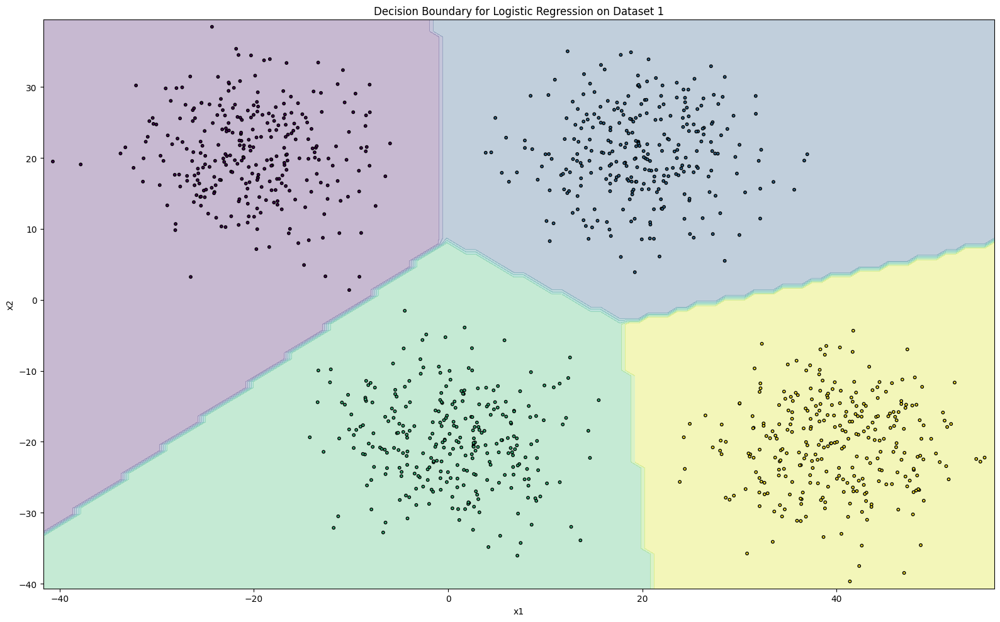

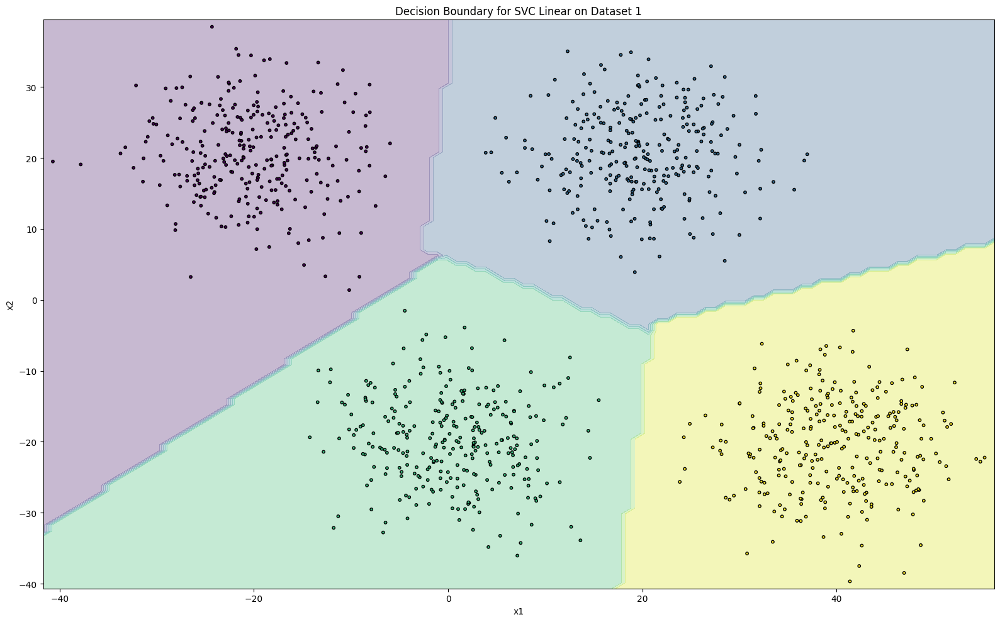

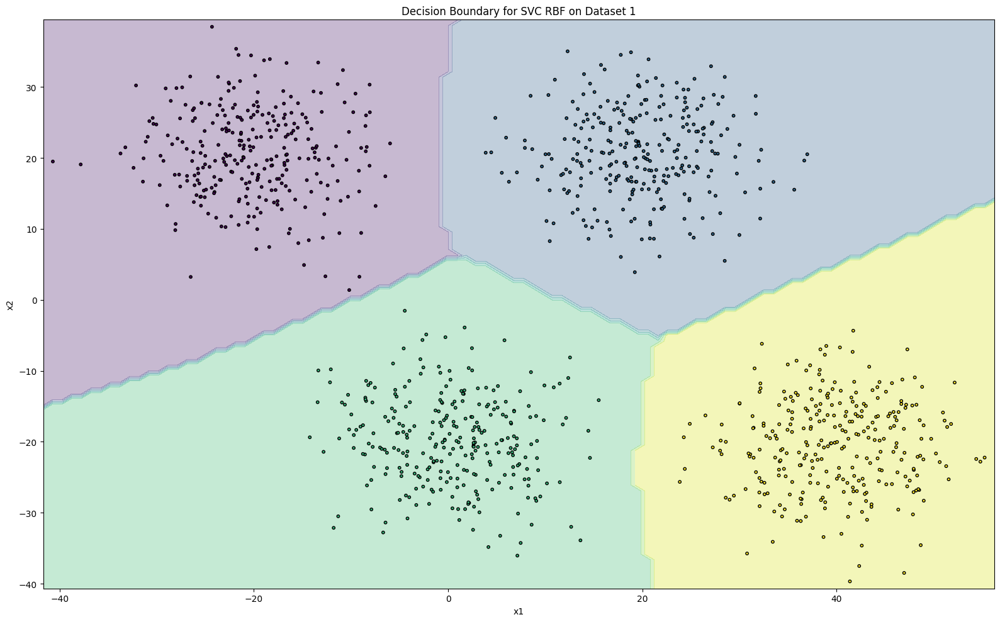

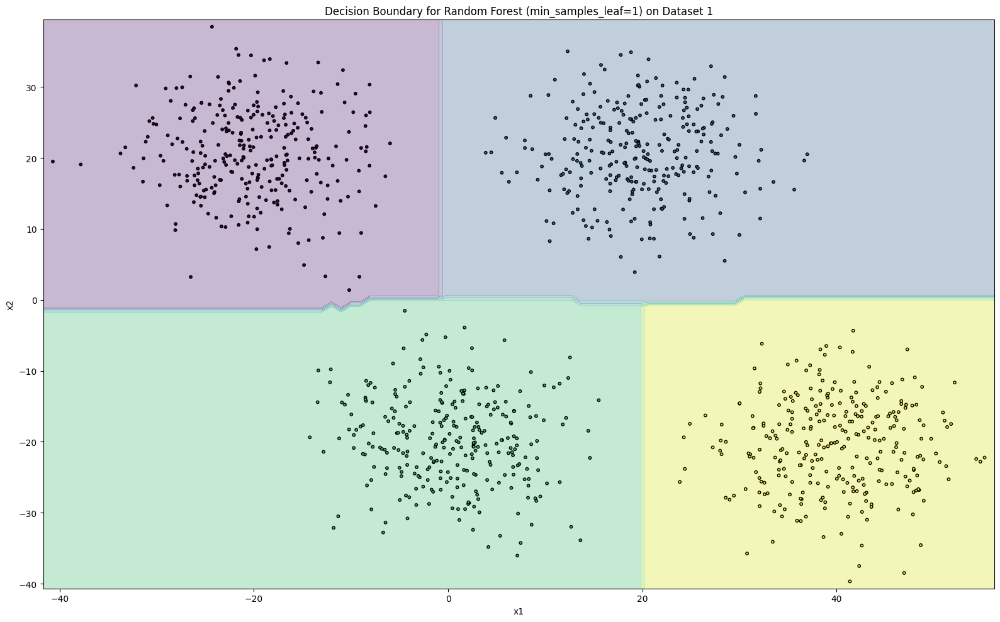

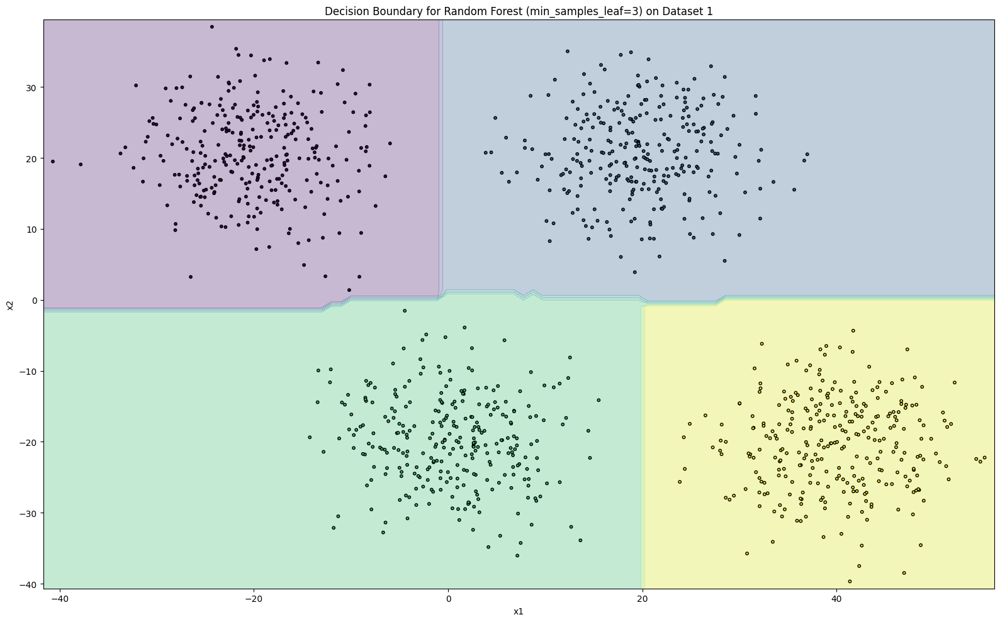

...

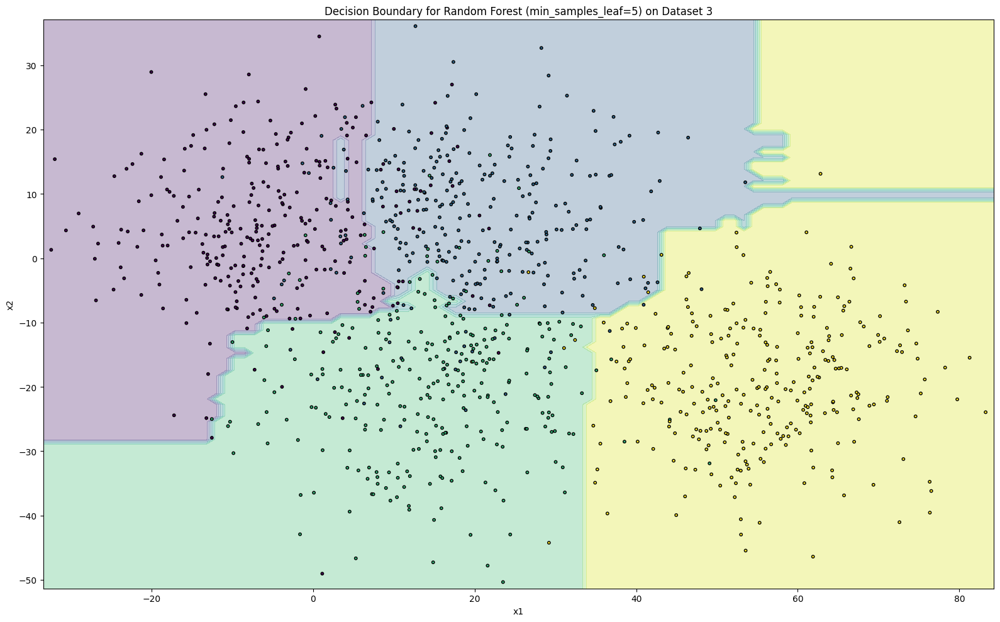

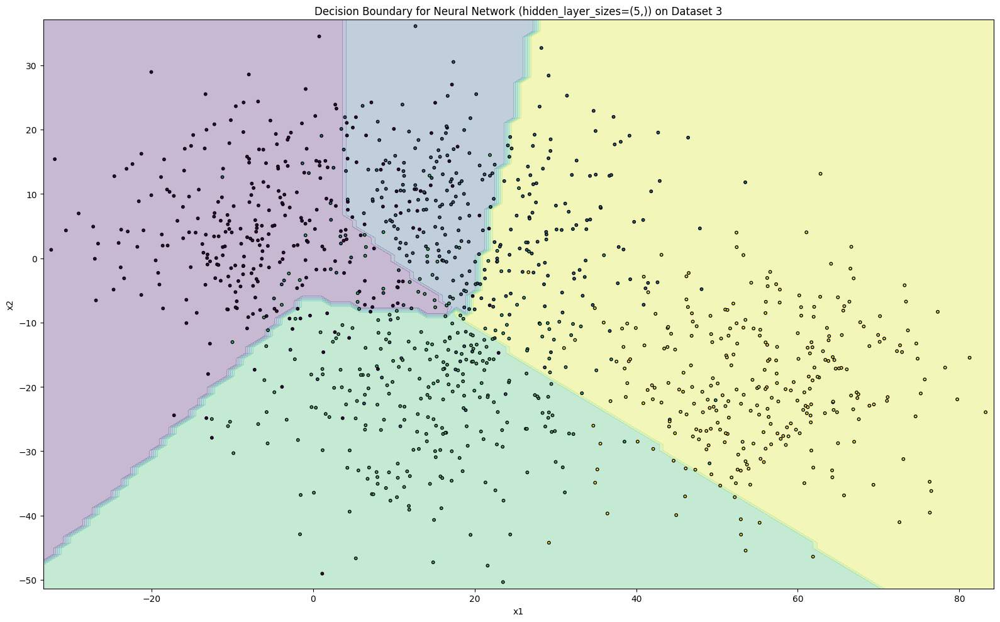

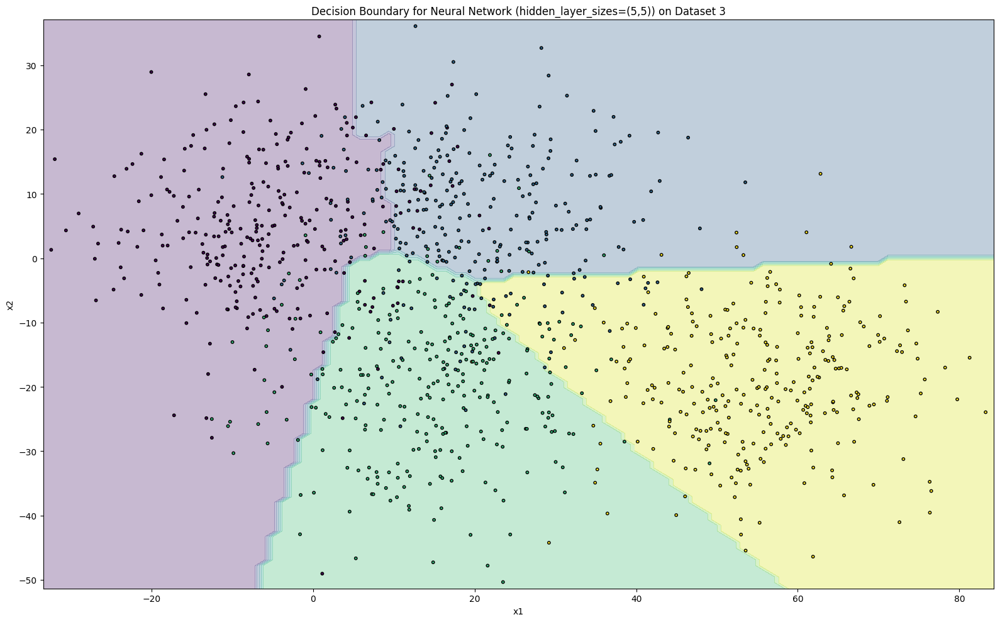

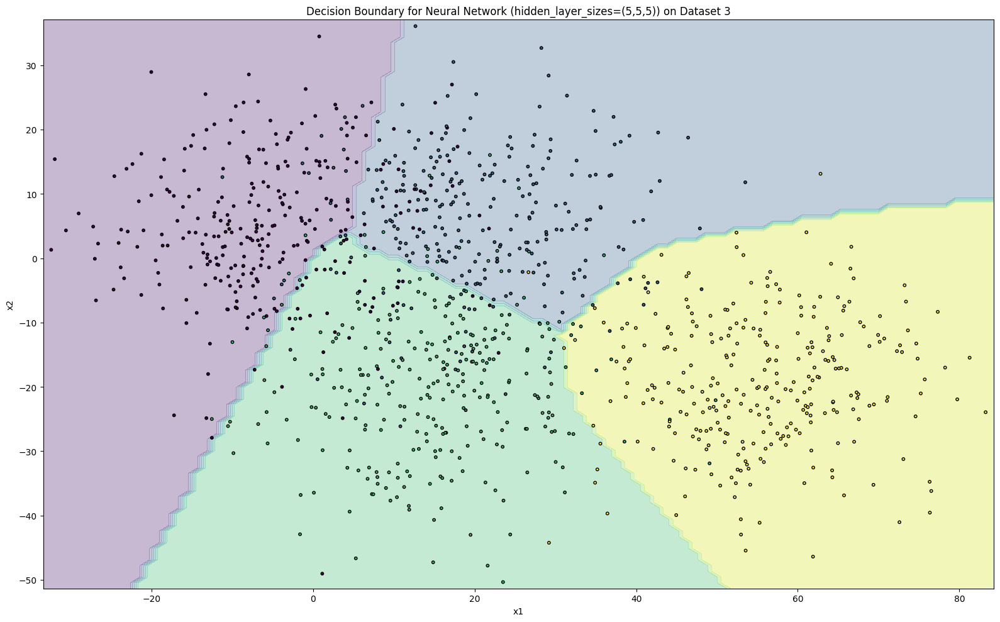

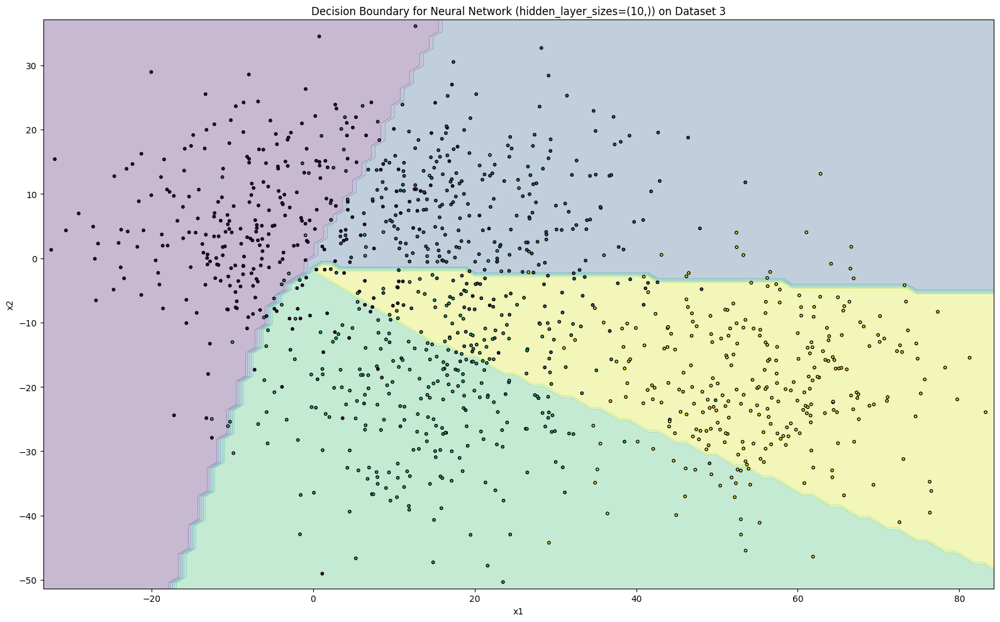

In [6]:
# Initialize classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'SVC Linear': SVC(kernel='linear', probability=True),
    'SVC RBF': SVC(kernel='rbf', probability=True),
    'Random Forest (min_samples_leaf=1)': RandomForestClassifier(min_samples_leaf=1),
    'Random Forest (min_samples_leaf=3)': RandomForestClassifier(min_samples_leaf=3),
    'Random Forest (min_samples_leaf=5)': RandomForestClassifier(min_samples_leaf=5),
    'Neural Network (hidden_layer_sizes=(5,))': MLPClassifier(hidden_layer_sizes=(5,)),
    'Neural Network (hidden_layer_sizes=(5,5))': MLPClassifier(hidden_layer_sizes=(5,5)),
    'Neural Network (hidden_layer_sizes=(5,5,5))': MLPClassifier(hidden_layer_sizes=(5,5,5)),
    'Neural Network (hidden_layer_sizes=(10,))': MLPClassifier(hidden_layer_sizes=(10,))
}

# Iterate over each dataset for classification
for i, (data, label) in enumerate(datasets):
    print(f"Classification results for {label}:\n")
    x_train, x_test, y_train, y_test = train_test_split(data[['x1','x2']], data['y'], test_size=0.2, random_state=42)
    
    for name, clf in classifiers.items():
        clf.fit(x_train, y_train)
        y_pred = clf.predict(x_test)
        acc = accuracy_score(y_test, y_pred) # model.score(x_test, y_test)
        print(f"{name} Accuracy: {acc:.2f}, {clf.score(x_test, y_test):.2f}")
        print(classification_report(y_test, y_pred))

        # Plot decision boundary
        plt.figure(figsize=(16, 10))
        draw_decision_boundary(clf, x_train.values, y_train.values, size=10)
        plt.title(f'Decision Boundary for {name} on {label}')
        plt.xlabel('x1')
        plt.ylabel('x2')
        plt.tight_layout()
        plt.savefig(f'Images/dataset-{i+1}-{name}-decision-boundary.png', dpi=400)
        # plt.show()
    print("\n")

In [7]:
def get_metrics(y_true, y_pred, y_prob):
    report = classification_report(y_true, y_pred, output_dict=True)
    acc = accuracy_score(y_true, y_pred)
    
    precisions = [report[f'{i+1}']['precision'] for i in range(4)]
    recalls = [report[f'{i+1}']['recall'] for i in range(4)]
    f1s = [report[f'{i+1}']['f1-score'] for i in range(4)]
    
    # AUC calculation using true values and predicted probabilities
    aucs = roc_auc_score(pd.get_dummies(y_true), y_prob, multi_class='ovr', average=None)
    
    precision_avg = sum(precisions) / 4
    recall_avg = sum(recalls) / 4
    f1_avg = sum(f1s) / 4
    auc_avg = sum(aucs) / 4
    
    return [acc, *precisions, precision_avg, *recalls, recall_avg, *f1s, f1_avg, *aucs, auc_avg]

def get_metrics_df(data, classifiers):
    x_train, x_test, y_train, y_test = train_test_split(data[['x1', 'x2']], data['y'], test_size=0.2, random_state=42)
    metrics = []
    
    for name, clf in classifiers.items():
        clf.fit(x_train, y_train)
        
        # Train predictions and probability estimates
        y_train_pred = clf.predict(x_train)
        if hasattr(clf, 'predict_proba'):
            y_train_prob = clf.predict_proba(x_train)
        else:
            # If no predict_proba, use decision_function and scale it to 0-1 range
            decision_values = clf.decision_function(x_train)
            y_train_prob = (decision_values - decision_values.min()) / (decision_values.max() - decision_values.min())
        
        train_metrics = get_metrics(y_train, y_train_pred, y_train_prob)
        
        # Test predictions and probability estimates
        y_test_pred = clf.predict(x_test)
        if hasattr(clf, 'predict_proba'):
            y_test_prob = clf.predict_proba(x_test)
        else:
            decision_values = clf.decision_function(x_test)
            y_test_prob = (decision_values - decision_values.min()) / (decision_values.max() - decision_values.min())
        
        test_metrics = get_metrics(y_test, y_test_pred, y_test_prob)
        
        # Append results for train and test sets
        metrics.append([name, 'train', *train_metrics])
        metrics.append([name, 'test', *test_metrics])
    
    # Define the DataFrame columns
    columns = ['algorithm_name', 'train_or_test_data', 'accuracy',
               'precision_1', 'precision_2', 'precision_3', 'precision_4', 'precision_avg',
               'recall_1', 'recall_2', 'recall_3', 'recall_4', 'recall_avg',
               'f1_1', 'f1_2', 'f1_3', 'f1_4', 'f1_avg',
               'auc_1', 'auc_2', 'auc_3', 'auc_4', 'auc_avg']
    
    ret = pd.DataFrame(metrics, columns=columns)
    
    return ret

# Run this on the datasets
for i, (data, label) in enumerate(datasets):
    metrics_df = get_metrics_df(data, classifiers)
    metrics_df.to_csv(f'Metrics/metrics-{i+1}.csv', index=False)


/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-pac

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


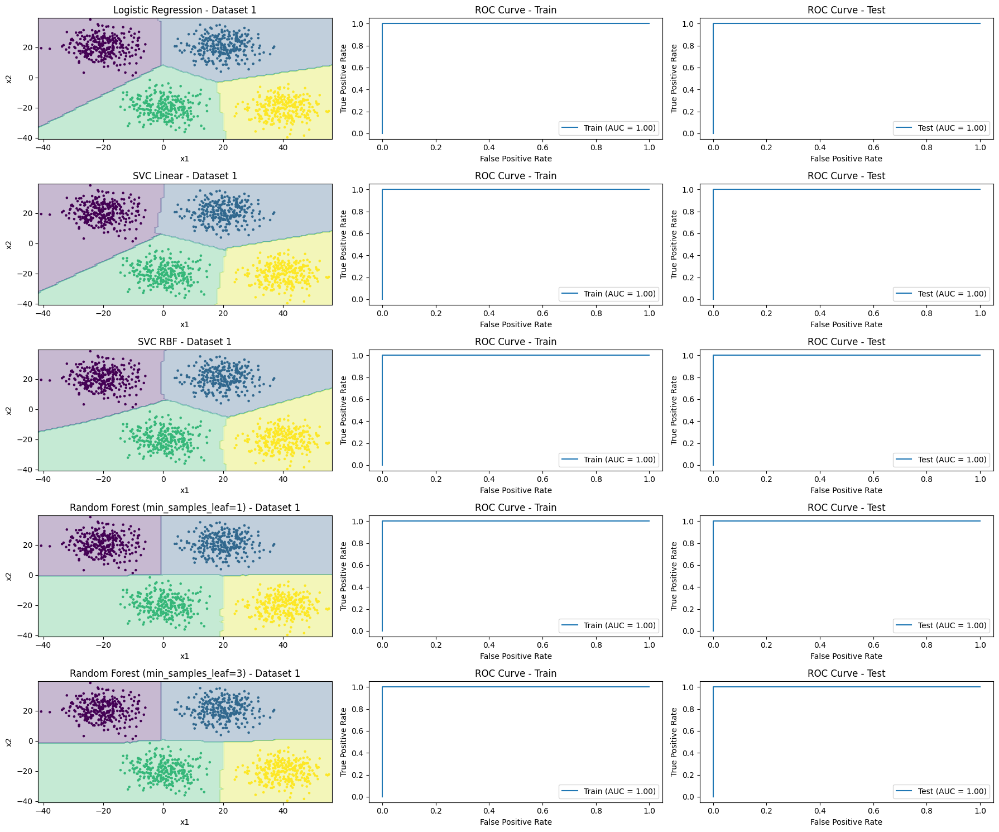

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier wa

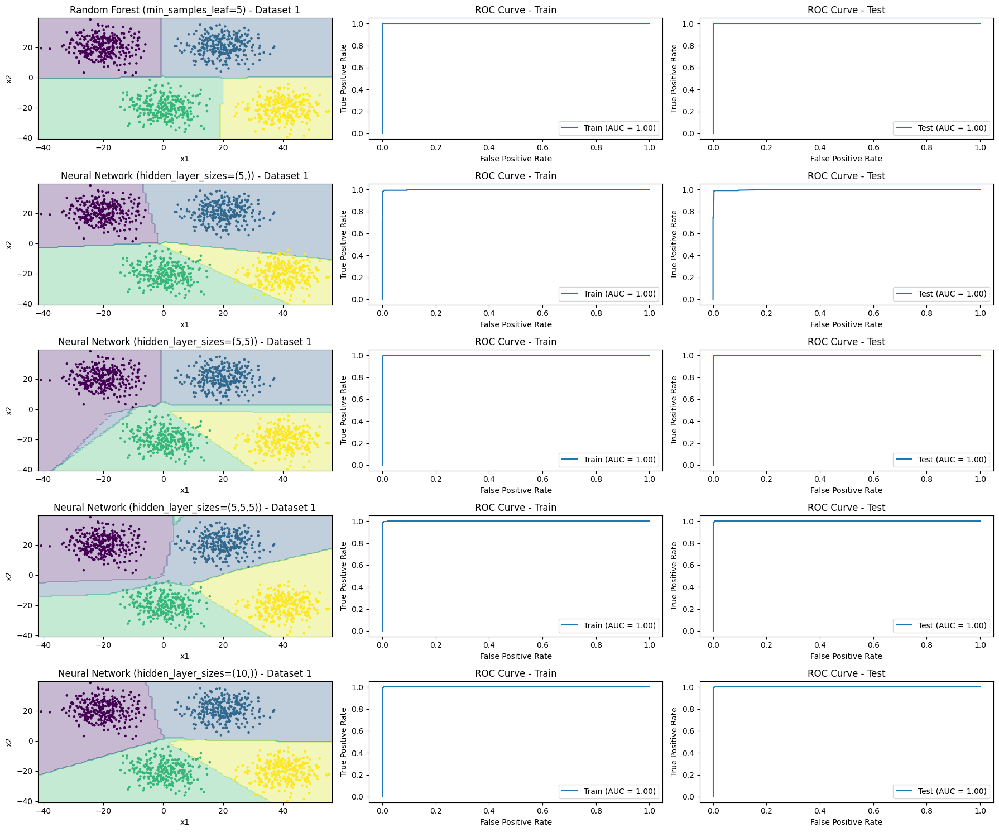

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


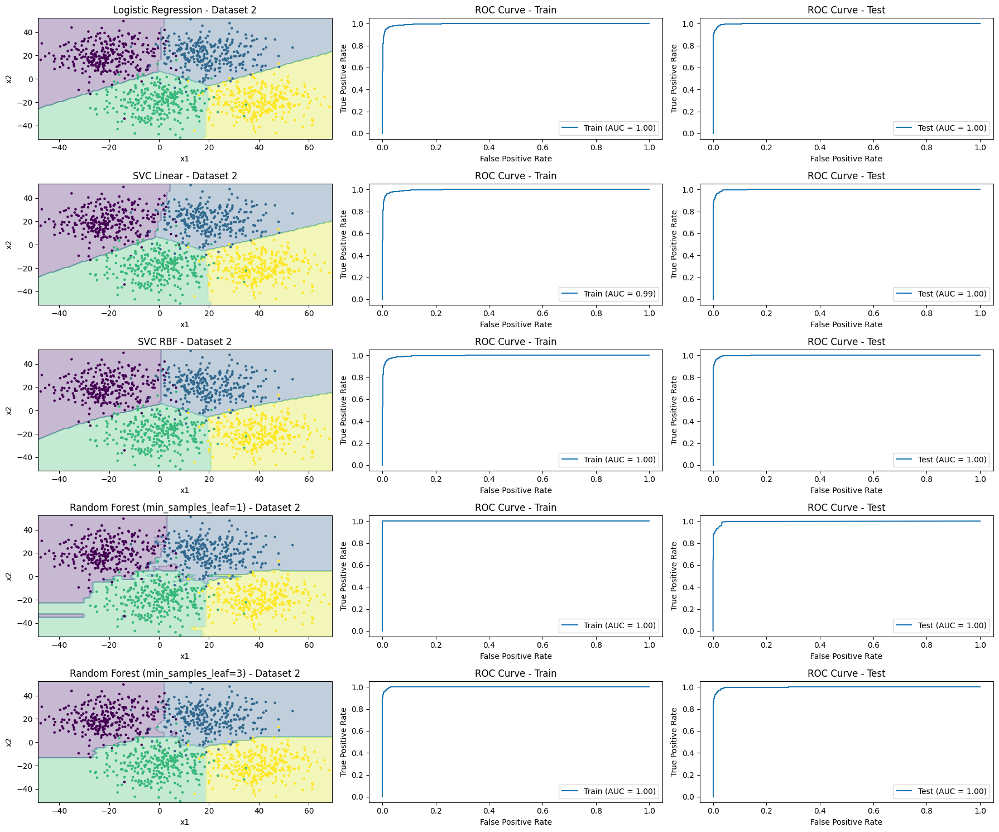

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier wa

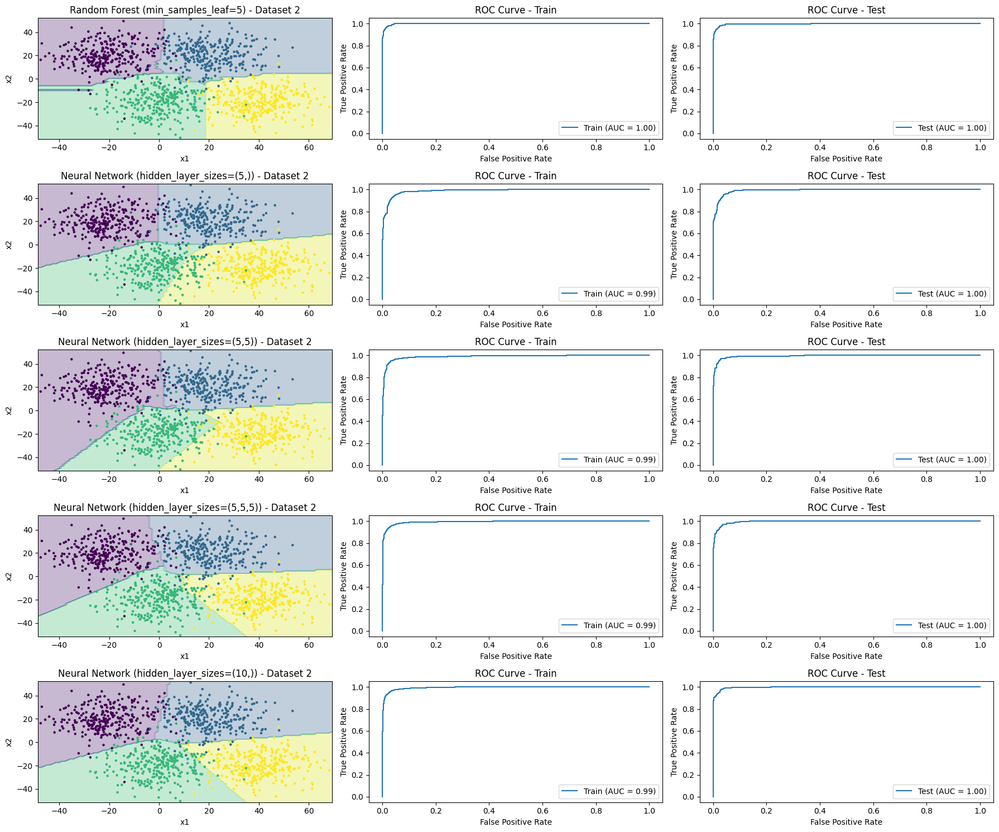

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


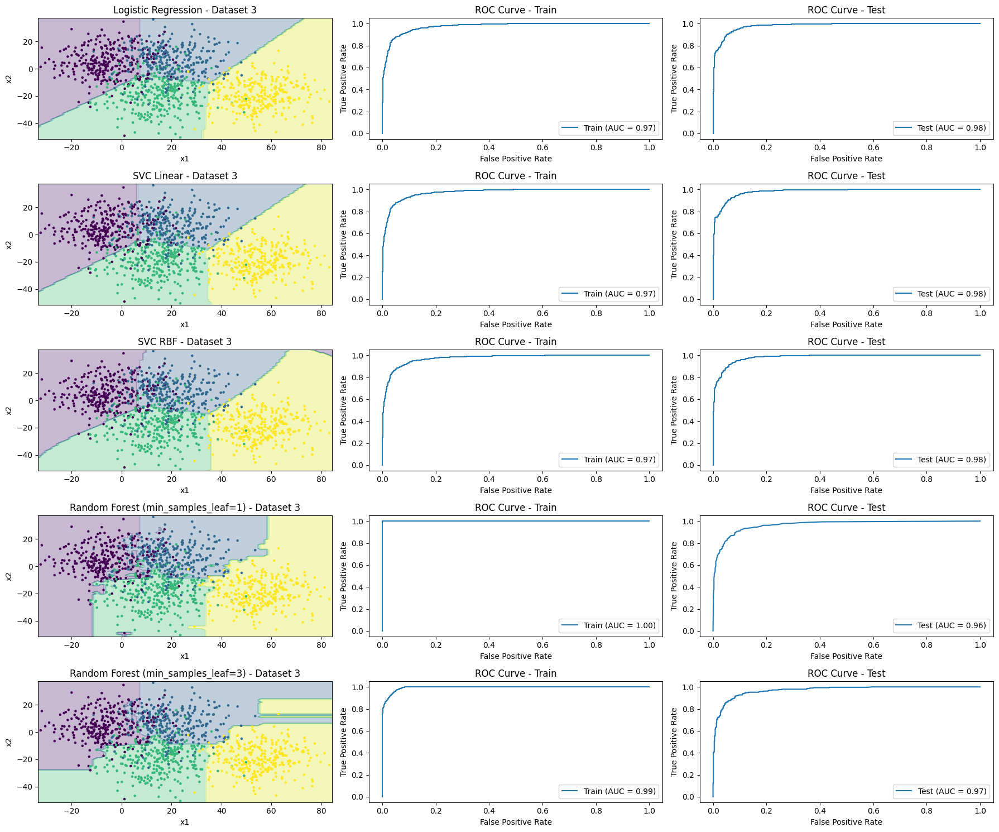

/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier was fitted with feature names
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
/home/nirav24/.local/lib/python3.12/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but MLPClassifier wa

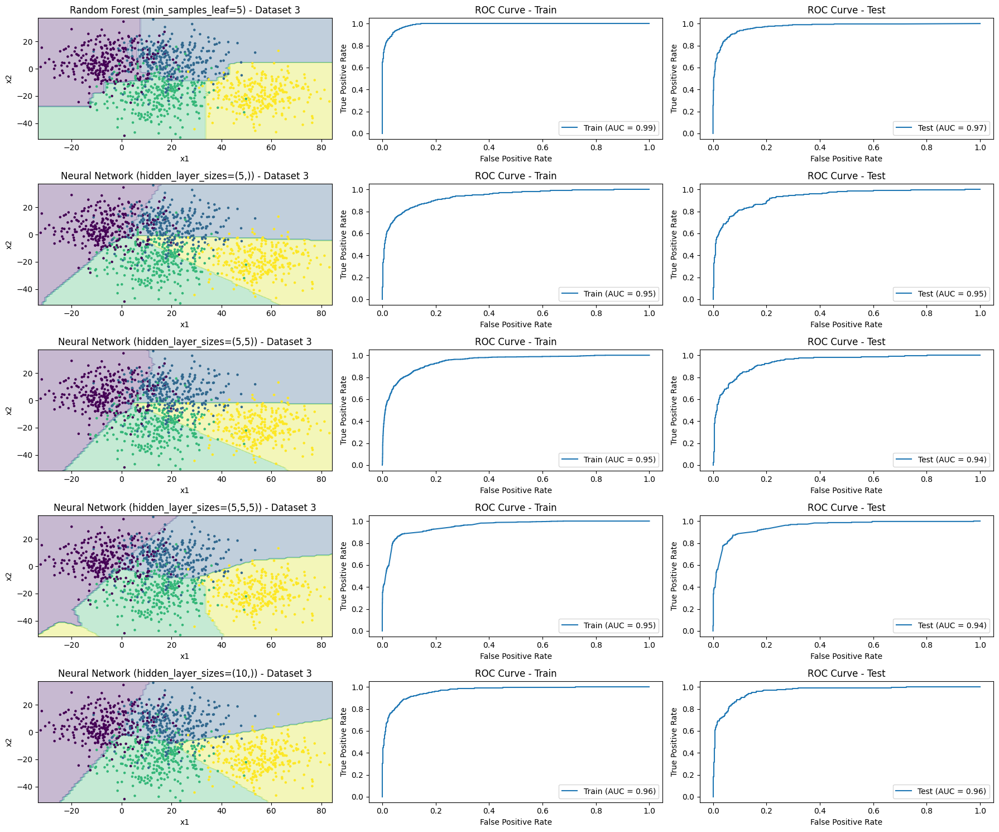

In [8]:
def draw_roc_curve(model, X, y, label):
    if not isinstance(X, pd.DataFrame):
        X = pd.DataFrame(X, columns=['x1', 'x2'])

    if hasattr(model, 'predict_proba'):
        y_prob = model.predict_proba(X)
    else:
        y_prob = model.decision_function(X)
        y_prob = (y_prob - y_prob.min()) / (y_prob.max() - y_prob.min())

    fpr, tpr, _ = roc_curve(pd.get_dummies(y).values.ravel(), y_prob.ravel())
    auc_score = roc_auc_score(pd.get_dummies(y), y_prob, multi_class='ovr')

    plt.plot(fpr, tpr, label=f'{label} (AUC = {auc_score:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {label}')
    plt.legend()

def draw_plots(classifiers, datasets):
    for i, (data, label) in enumerate(datasets):
        plt.figure(figsize=(18, 15))
        
        for row, (name, clf) in enumerate(classifiers.items()):
            x_train, x_test, y_train, y_test = train_test_split(data[['x1', 'x2']], data['y'], test_size=0.2, random_state=42)
            
            x_train_df = pd.DataFrame(x_train, columns=['x1', 'x2'])
            x_test_df = pd.DataFrame(x_test, columns=['x1', 'x2'])
            y_train = pd.Series(y_train)
            
            clf.fit(x_train_df, y_train.values)

            plt.subplot(len(classifiers)//2, 3, (row % 5) * 3 + 1)
            draw_decision_boundary(clf, x_train_df.values, y_train.values, size=5, edgecolor=None)
            plt.title(f'{name} - {label}')
            plt.xlabel('x1')
            plt.ylabel('x2')

            plt.subplot(len(classifiers)//2, 3, (row % 5) * 3 + 2)
            draw_roc_curve(clf, x_train_df, y_train, 'Train')

            plt.subplot(len(classifiers)//2, 3, (row % 5) * 3 + 3)
            draw_roc_curve(clf, x_test_df, y_test, 'Test')

            if row == 4:
                plt.tight_layout()
                plt.savefig(f'Images/dataset-{i+1}-roc-curves-1.png', dpi=400)
                plt.show()
                plt.figure(figsize=(18, 15))


        plt.tight_layout()
        plt.savefig(f'Images/dataset-{i+1}-roc-curves-2.png', dpi=400)
        plt.show()

draw_plots(classifiers, datasets)
